### **Proyecto Integrador Maestría en Ciencia de Datos**

Proyecto #4 de la materia Ingeniería de Caracteristicas impartida por el Dr. Julio Waissman en la Maestría en Ciencia de Datos.

Elaborado por:


*   Carlos Alejandro Velázquez Valdez



### **Descripción del problema**

La disposición inadecuada de residuos sólidos es uno de los mayores problemas que enfrentan las ciudades. En años recientes se ha disparado la aparición de tiraderos clandestinos de basura en muchas áreas de la Ciudad de México(CDMX), representando un reto técnico, presupuestario y legal para los gobiernos. Es importante encontrar maneras para prevenir que se formen más tiraderos clandestinos. Previamente se han usado diferentes maneras para combatir la formación de estos, por ejemplo en Xochimilco se [implementó un programa de vigilancia](https://www.excelsior.com.mx/comunidad/xochimilco-va-contra-tiraderos-clandestinos/1273959). Por otro lado, en Tlalnepantla se han [transformado tiraderos clandestinos en areas verdes.](https://continuamos.mx/?p=1861)

El Centro de Comando, Control, Cómputo, Comunicaciones y Contacto Ciudadano de la Ciudad de México “C5”, tiene instalados más de 13 mil postes los cuales incluyen más de 15 mil cámaras de vigilancia que hay en la Ciudad de México (Sistema Tecnológico de Videovigilancia STVs), con la finalidad de prevenir y alertar inmediatamente a las autoridades de seguridad y de emergencias capitalinas sobre cualquier situación de riesgo. Uno de los objetivos de este proyecto es ver si el número de postes C5 implementados(postes de vigilancia) están relacionados con los tiraderos clandestinos reportados.

Por otra parte, ha sido reportado previamente que la CDMX [carece de espacios verdes suficientes](https://www.forbes.com.mx/cdmx-carece-de-espacios-verdes-suficientes-greenpeace/), por lo que otro objetivo de este proyecto será analizar los datos de areas verdes existentes en CDMX y analisar si tienen relación con los tiraderos clandestinos existentes.

En este proyecto se utilizarán Datasets obtenidos del [Portal de Datos Abiertos de la CDMX](https://datos.cdmx.gob.mx/).

### **Obtención de información**



Los datos utilizados en este proyecto fueron extraidos de las siguientes bases de datos:    

*   Wifi gratuito en postes C5: https://datos.cdmx.gob.mx/dataset/ubicacion-acceso-gratuito-internet-wifi-c5
*   Wifi gratuito en Sitios Publicos: https://datos.cdmx.gob.mx/dataset/sitios-publicos-wifi
*   Wifi gratuito en Postes MiBarrio: https://datos.cdmx.gob.mx/dataset/wifi-de-barrio
*   Wifi gratuito en PILARES Disponible en: https://datos.cdmx.gob.mx/dataset/wifi-gratuito-en-pilares 
*   Areas Verdes de la Ciudad de Mexico (2021) Disponible en: https://datos.cdmx.gob.mx/dataset/cdmx_areas_verdes_2017
*   Tiraderos clandestinos de la Ciudad de Mexico (2017) Disponible en: https://datos.cdmx.gob.mx/dataset/tiraderos-clandestinos-al-cierre-de-2017
*   Alcaldía (Shapefiles) (2021) Disponible en: https://datos.cdmx.gob.mx/dataset/alcaldias/resource/8648431b-4f34-4f1a-a4b1-19142f944300?inner_span=True


In [ ]:
#Instalación de librerias necesarias
!pip install geopandas
!pip install contextily
!pip install pyod

In [2]:
#Imports necesarios para todo el notebook
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas
import contextily as cx
import missingno as msno
from matplotlib.lines import Line2D 
from pyod.models.knn import KNN
from __future__ import print_function
import time
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D


In [3]:
#Importando datos de Wifi en Sitios Publicos
internet_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/f14bbd14-9872-4b50-8c21-1efebb8108da/resource/1c9aa7ab-49f6-4fbb-ab8f-9e2837c3010f/download/wifi_gratuito_en_sitios_publicos.csv',
                            encoding='ISO-8859-1',
                            index_col = 0)
internet_data.head()

,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
ID,,,,,,
Viveros De Coyoacán,DEL CARMEN,COYOACÁN,19.35370,-99.17177,1,Sitios_Publicos
Villa,VILLA GUSTAVO A MADERO,GUSTAVO A. MADERO,19.48710,-99.11429,1,Sitios_Publicos
Toxicológico Xochimilco,TIERRA NUEVA,XOCHIMILCO,19.26485,-99.11495,1,Sitios_Publicos
Toxicológico Venustiano Carranza,CUCHILLA PANTITLAN 2156,VENUSTIANO CARRANZA,19.42128,-99.06899,1,Sitios_Publicos
Ticomán,LA PURISIMA TICOMAN,GUSTAVO A. MADERO,19.50900,-99.13260,4,Sitios_Publicos


In [4]:
#Importando Datos de Wifi en Postes Mi Barrio
mibarrio_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/bbbd201b-28fc-4a2b-978b-1968829c1d54/resource/7bb21e65-d6d1-44c3-8db0-ee91012ac2d9/download/wifi_gratuito_en_postes_mi_barrio.csv',
                            encoding='ISO-8859-1',
                            index_col = 0)
mibarrio_data.head()

,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
ID,,,,,,
MC11349,LOMAS DE CUILOTEPEC 2272,TLALPAN,19.271800,-99.233433,1,Mi_Barrio
MC3909,CENTRO,CUAUHTÉMOC,19.433272,-99.142814,1,Mi_Barrio
MC12425,TLALCOLIGIA,TLALPAN,19.277268,-99.172666,1,Mi_Barrio
MC11517,MIGUEL HIDALGO 2DA SECCION,TLALPAN,19.278665,-99.196977,1,Mi_Barrio
MC11791,SANTA URSULA XITLA,TLALPAN,19.272633,-99.180923,1,Mi_Barrio


In [5]:
#Importando Datos de WIfi en Postes C5
c5_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/909a033e-9a2c-41c7-a10e-ab1bd92a8095/resource/7cc6ff61-6178-4ba6-b39f-1f9eb3def57b/download/wifi_gratuito_en_postes_c5.csv',
                      encoding='ISO-8859-1',
                      index_col = 0) 
c5_data.head()

,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
ID,,,,,,
1,CENTRO,CUAUHTÉMOC,19.43528,-99.14715,1,Postes_C5
2,CENTRO,CUAUHTÉMOC,19.43510,-99.14582,1,Postes_C5
3,CENTRO,CUAUHTÉMOC,19.43457,-99.14386,1,Postes_C5
4,CENTRO,CUAUHTÉMOC,19.43437,-99.14270,1,Postes_C5
5,CENTRO,CUAUHTÉMOC,19.43424,-99.14188,1,Postes_C5


In [6]:
#Importando Datos de Wifi en Programa PILARES
pilares_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/1ffc6aa1-7018-4f52-9d5d-ec1be27effce/resource/195d7999-5954-49ae-bdc3-3895dba766b9/download/wifi_gratuito_en_pilares.csv', 
                           encoding='ISO-8859-1',
                           index_col = 0)
pilares_data.head()

,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
ID,,,,,,
LOMAS DE LA ESTANCIA,SANTIAGO ACAHUALTEPEC 2DA AMPLIACION 2530,IZTAPALAPA,19.340495,-99.007658,3,PILARES
MOCTEZUMA,MOCTEZUMA 2DA SECCION,VENUSTIANO CARRANZA,19.428014,-99.101105,5,PILARES
SAN JUAN DE ARAGÓN,SAN JUAN DE ARAGON I SECCION 2437,GUSTAVO A. MADERO,19.457270,-99.083040,5,PILARES
SAN MIGUEL TEOTONGO,SAN MIGUEL TEOTONGO,IZTAPALAPA,19.340483,-98.992478,3,PILARES
CIBERESCUELA CUAJIMALPA,CUAJIMALPA,CUAJIMALPA DE MORELOS,19.358134,-99.301223,1,PILARES


In [7]:
#Concatenando todos los Datos de Wifi
internet_cdmx = pd.concat([pilares_data, c5_data, internet_data, mibarrio_data])
internet_cdmx.head()

,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
ID,,,,,,
LOMAS DE LA ESTANCIA,SANTIAGO ACAHUALTEPEC 2DA AMPLIACION 2530,IZTAPALAPA,19.340495,-99.007658,3,PILARES
MOCTEZUMA,MOCTEZUMA 2DA SECCION,VENUSTIANO CARRANZA,19.428014,-99.101105,5,PILARES
SAN JUAN DE ARAGÓN,SAN JUAN DE ARAGON I SECCION 2437,GUSTAVO A. MADERO,19.457270,-99.083040,5,PILARES
SAN MIGUEL TEOTONGO,SAN MIGUEL TEOTONGO,IZTAPALAPA,19.340483,-98.992478,3,PILARES
CIBERESCUELA CUAJIMALPA,CUAJIMALPA,CUAJIMALPA DE MORELOS,19.358134,-99.301223,1,PILARES


In [8]:
#Importando Datos de Sitios Verdes en CDMX
verde_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/6e9d5e75-9cf1-4ebf-b592-69ac7a89414e/resource/dec7a37a-0a32-4713-a50f-6ea646df5ab4/download/cdmx_areas_verdes_2017.csv',
                         index_col = 0)
verde_data.head()

,geo_point_2d,geo_shape,muerdago,p_sp_her_d,zonifica,subcat_sed,subcve_sed,p_manejo,tipo,p_sp_abs_d,f_decreto,direccion,gid,cve_delg,p_arbustiv,ubicacion,nombre,delegacion,p_sp_arb_d,p_herbaceo,p_sp_do_mu,p_arboreo,categoria,superficie,e_urbano,perimetro,cve_sedema,responsabl
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Panteones,604.0,NaN,NaN,NaN,NaN,Román Álvarez Moreno,268,2,NaN,NaN,NaN,Azcapotzalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,6660.027554,NaN,329.264738,600,NaN
1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Deportivos,601.0,NaN,NaN,NaN,NaN,Avenida Canal deTezontle,87,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,2917.257837,NaN,272.243614,600,NaN
2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Camellones centrales y laterales,203.0,NaN,NaN,NaN,NaN,Canal Río Churubusco,180,8,NaN,NaN,CAMELLON EJE 4 OTE. (RIO CHURUBUSCO),Iztacalco,NaN,NaN,NaN,NaN,Áreas verdes complementarias o ligadas a la re...,1086.305646,NaN,425.043656,200,NaN
3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,CORTEZA,89,8,NaN,AV. GIRASOL ENTRE MAGUEY Y CUMBRE.,"PARQUE GIRASOL ""CENTRAL INFONAVIT"".",Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,3605.704046,NaN,269.209436,600,NaN
4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,El Lago,90,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,19619.361577,NaN,798.409227,600,NaN


In [9]:
#Importando datos de tiraderos clandestinos de la CDMX
tiradero_data = pd.read_csv('https://datos.cdmx.gob.mx/dataset/c5a40bb7-241c-4bb0-8a59-6218526ba01c/resource/7041d302-e17b-4137-94a7-383b6b713761/download/tiraderos-clandestinos-al-cierre-de-2017.csv',
                            index_col = 0)
tiradero_data.head()

,column_1,fid,id_sedema,no_alcaldi,alcaldia,direccion,tipo_tirad,calle,no_ext,no_int,colonia,entre_que,longitud,latitud,geo_point
id,,,,,,,,,,,,,,,
0,6,6,567,14,Benito Juarez,NaN,NaN,"Municipio Libre Es2Quina Miraflores, Colonia P...",NaN,NaN,PORTALES ORIENTE,NaN,-99.139980,19.367720,"19.36772,-99.13998"
1,41,41,402,9,Milpa Alta,NaN,NaN,Av. Hifalgo Y 2Ç÷ Cjon De Independencia,NaN,NaN,SAN PEDRO ATOCPAN,NaN,-99.042876,19.203210,"19.2032099,-99.0428762"
2,78,78,508,11,Tlahuac,NaN,NaN,Angƒ??lica Paulet,NaN,NaN,LA NOPALERA,NaN,-99.055393,19.296997,"19.296997,-99.055393"
3,81,81,62,3,Coyoacan,NaN,NaN,Bodega De Barrido Manual Santa Cecilia,NaN,NaN,CTM SECCIÇÿN 10,NaN,-99.107160,19.300200,"19.3002,-99.1071599"
4,83,83,498,11,Tlahuac,NaN,NaN,Av. Tl¶ÿ¶Huac,NaN,NaN,LA NOPALERA,NaN,-99.054197,19.302147,"19.302147,-99.054197"


### **Limpieza y armonizando de variables**

#### Limpiando datos de Puntos de Servicio de Wifi Gratuito

In [10]:
internet_cdmx.head()

,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
ID,,,,,,
LOMAS DE LA ESTANCIA,SANTIAGO ACAHUALTEPEC 2DA AMPLIACION 2530,IZTAPALAPA,19.340495,-99.007658,3,PILARES
MOCTEZUMA,MOCTEZUMA 2DA SECCION,VENUSTIANO CARRANZA,19.428014,-99.101105,5,PILARES
SAN JUAN DE ARAGÓN,SAN JUAN DE ARAGON I SECCION 2437,GUSTAVO A. MADERO,19.457270,-99.083040,5,PILARES
SAN MIGUEL TEOTONGO,SAN MIGUEL TEOTONGO,IZTAPALAPA,19.340483,-98.992478,3,PILARES
CIBERESCUELA CUAJIMALPA,CUAJIMALPA,CUAJIMALPA DE MORELOS,19.358134,-99.301223,1,PILARES


In [11]:
internet_cdmx.dtypes

Colonia              object
Alcaldía             object
Latitud             float64
Longitud            float64
Puntos_de_acceso      int64
Programa             object
dtype: object

Observamos que la columna Alcaldía y Programa están como object cuando en realidad es una variable categórica, por lo que la cambiaremos.

In [12]:
internet_cdmx['Alcaldía'] = internet_cdmx['Alcaldía'].astype('category')
internet_cdmx['Programa'] = internet_cdmx['Programa'].astype('category')

In [13]:
#Confirmamos que se haya cambiado el tipo de datos
internet_cdmx.dtypes

Colonia               object
Alcaldía            category
Latitud              float64
Longitud             float64
Puntos_de_acceso       int64
Programa            category
dtype: object

Como se puede ver en la siguiente gráfica, no hay valores perdidos, lo cual presenta una ventaja a la hora de su análisis.

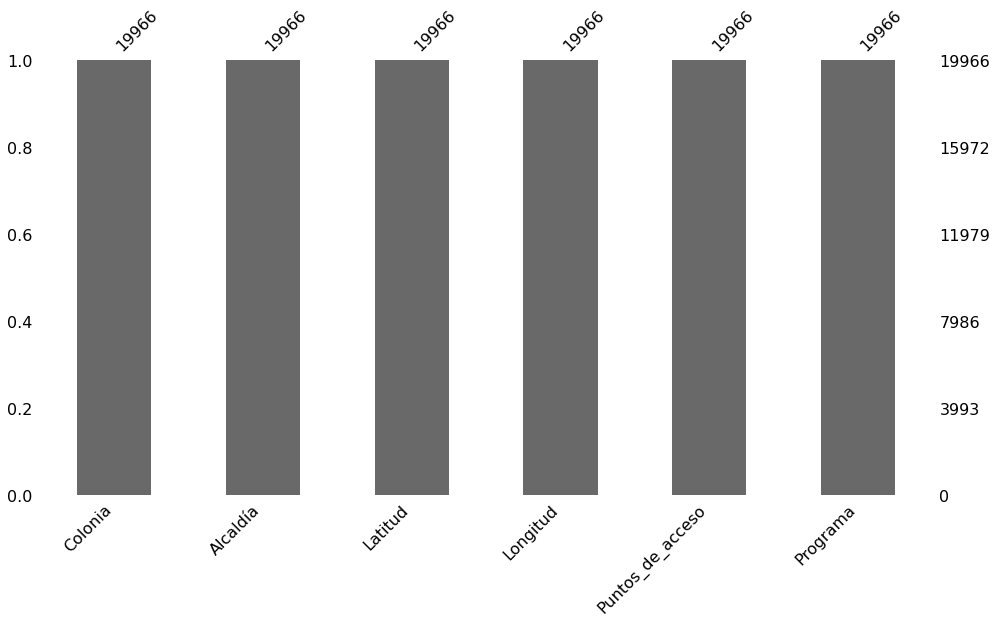

In [14]:
msno.bar(internet_cdmx, figsize=(16,8))

Despues buscaremos por valores duplicados

In [15]:
duplicate_rows_df = internet_cdmx[internet_cdmx.duplicated()]
duplicate_rows_df.shape
print(f'Numero de registros duplicados: {duplicate_rows_df.shape[0]}')

Numero de registros duplicados: 15


Ahora para la detección de outliers analizaremos solo Latitud y Longitud, como estaremos trabajando con coordenadas, bastará con usar el método .describe() para ver los percentiles, el mínimo y el máximo, y asi ya tener más claro si hay Outliers (por ejemplo si se equivocaron y pusieron latitud donde iba longitud y vice versa sería evidente al ver el máximo y el mínimo)

In [16]:
internet_cdmx[['Latitud','Longitud']].describe(percentiles=[.01,.05,.1,.25,.5,.9,.95,.99])

,Latitud,Longitud
count,19966.000000,19966.000000
mean,19.379200,-99.147918
std,0.075099,0.065700
min,19.123390,-99.348480
1%,19.198459,-99.300227
5%,19.260274,-99.249732
10%,19.283403,-99.228085
25%,19.324575,-99.192148
50%,19.379174,-99.150299
90%,19.477984,-99.059855


Al observar el máximo y el mínimo de las columnas vemos que no hay valores extremos que estén muy alejados de la media. Nota: Podríamos aplicar el Z-Score con el fin de descartar a aquellos que se alejen más de 2 o 3 desviaciones estándar pero aquí nos interesa mantener esos datos porque brindarán información importante ya sea de las cámaras de vigilancia(postes c5) o de los tiraderos de basura clandestinos.

#### Limpiando datos de tiraderos clandestinos

Antes de cambiar el tipo de dato de las columnas, con el método .head() a simple vista vemos que hay columnas que apuntan a tener muchos valores perdidos, por lo que primero confirmaremos el número de valores perdidos.

In [17]:
tiradero_data.head()

,column_1,fid,id_sedema,no_alcaldi,alcaldia,direccion,tipo_tirad,calle,no_ext,no_int,colonia,entre_que,longitud,latitud,geo_point
id,,,,,,,,,,,,,,,
0,6,6,567,14,Benito Juarez,NaN,NaN,"Municipio Libre Es2Quina Miraflores, Colonia P...",NaN,NaN,PORTALES ORIENTE,NaN,-99.139980,19.367720,"19.36772,-99.13998"
1,41,41,402,9,Milpa Alta,NaN,NaN,Av. Hifalgo Y 2Ç÷ Cjon De Independencia,NaN,NaN,SAN PEDRO ATOCPAN,NaN,-99.042876,19.203210,"19.2032099,-99.0428762"
2,78,78,508,11,Tlahuac,NaN,NaN,Angƒ??lica Paulet,NaN,NaN,LA NOPALERA,NaN,-99.055393,19.296997,"19.296997,-99.055393"
3,81,81,62,3,Coyoacan,NaN,NaN,Bodega De Barrido Manual Santa Cecilia,NaN,NaN,CTM SECCIÇÿN 10,NaN,-99.107160,19.300200,"19.3002,-99.1071599"
4,83,83,498,11,Tlahuac,NaN,NaN,Av. Tl¶ÿ¶Huac,NaN,NaN,LA NOPALERA,NaN,-99.054197,19.302147,"19.302147,-99.054197"


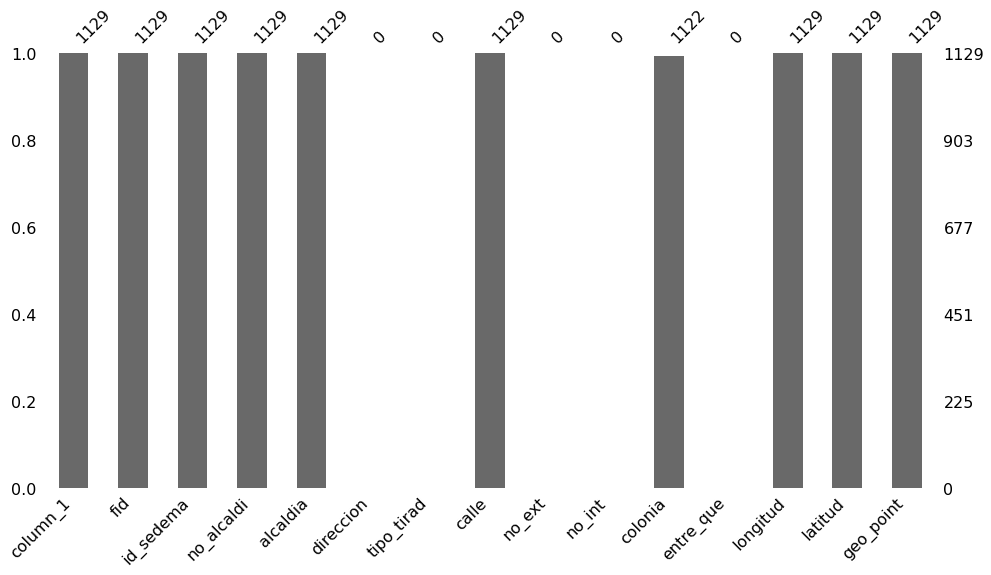

In [18]:
msno.bar(tiradero_data, figsize=(16,8))

Efectivamente, vemos que hay columnas que tienen puros datos perdidos, por lo que las eliminaremos.

In [19]:
tiradero_data.drop(['direccion','tipo_tirad', 'no_ext', 'no_int', 'entre_que'], axis=1, inplace=True)
tiradero_data.head()

,column_1,fid,id_sedema,no_alcaldi,alcaldia,calle,colonia,longitud,latitud,geo_point
id,,,,,,,,,,
0,6,6,567,14,Benito Juarez,"Municipio Libre Es2Quina Miraflores, Colonia P...",PORTALES ORIENTE,-99.139980,19.367720,"19.36772,-99.13998"
1,41,41,402,9,Milpa Alta,Av. Hifalgo Y 2Ç÷ Cjon De Independencia,SAN PEDRO ATOCPAN,-99.042876,19.203210,"19.2032099,-99.0428762"
2,78,78,508,11,Tlahuac,Angƒ??lica Paulet,LA NOPALERA,-99.055393,19.296997,"19.296997,-99.055393"
3,81,81,62,3,Coyoacan,Bodega De Barrido Manual Santa Cecilia,CTM SECCIÇÿN 10,-99.107160,19.300200,"19.3002,-99.1071599"
4,83,83,498,11,Tlahuac,Av. Tl¶ÿ¶Huac,LA NOPALERA,-99.054197,19.302147,"19.302147,-99.054197"


Una vez que ya no tenemos valores perdidos, ahora podemos verificar si el tipo de datos de las columnas es el correcto

In [20]:
tiradero_data.dtypes

column_1        int64
fid             int64
id_sedema       int64
no_alcaldi      int64
alcaldia       object
calle          object
colonia        object
longitud      float64
latitud       float64
geo_point      object
dtype: object

Como en el Dataset anterior, cambiaremos la columna alcaldia por un tipo de dato categórico y confirmamos que cambió

In [21]:
tiradero_data['alcaldia'] = tiradero_data['alcaldia'].astype('category')
tiradero_data.dtypes

column_1         int64
fid              int64
id_sedema        int64
no_alcaldi       int64
alcaldia      category
calle           object
colonia         object
longitud       float64
latitud        float64
geo_point       object
dtype: object

Confirmamos que no haya valores duplicados

In [22]:
duplicate_rows_df = tiradero_data[tiradero_data.duplicated()]
duplicate_rows_df.shape
print(f'Numero de registros duplicados: {duplicate_rows_df.shape[0]}')

Numero de registros duplicados: 0


Buscamos outliers de la misma manera que en el Dataset pasado y confirmamos que no haya nada fuera de lo esperado.

In [23]:
tiradero_data[['latitud','longitud']].describe(percentiles=[.01,.05,.1,.25,.5,.9,.95,.99])

,latitud,longitud
count,1129.000000,1129.000000
mean,19.390573,-99.128750
std,0.055082,0.056193
min,19.170147,-99.312535
1%,19.209883,-99.247021
5%,19.302420,-99.204309
10%,19.320405,-99.193730
25%,19.355470,-99.163900
50%,19.395870,-99.135410
90%,19.450500,-99.043866


#### Limpiando datos de Areas verdes

In [24]:
verde_data.head()

,geo_point_2d,geo_shape,muerdago,p_sp_her_d,zonifica,subcat_sed,subcve_sed,p_manejo,tipo,p_sp_abs_d,f_decreto,direccion,gid,cve_delg,p_arbustiv,ubicacion,nombre,delegacion,p_sp_arb_d,p_herbaceo,p_sp_do_mu,p_arboreo,categoria,superficie,e_urbano,perimetro,cve_sedema,responsabl
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Panteones,604.0,NaN,NaN,NaN,NaN,Román Álvarez Moreno,268,2,NaN,NaN,NaN,Azcapotzalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,6660.027554,NaN,329.264738,600,NaN
1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Deportivos,601.0,NaN,NaN,NaN,NaN,Avenida Canal deTezontle,87,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,2917.257837,NaN,272.243614,600,NaN
2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Camellones centrales y laterales,203.0,NaN,NaN,NaN,NaN,Canal Río Churubusco,180,8,NaN,NaN,CAMELLON EJE 4 OTE. (RIO CHURUBUSCO),Iztacalco,NaN,NaN,NaN,NaN,Áreas verdes complementarias o ligadas a la re...,1086.305646,NaN,425.043656,200,NaN
3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,CORTEZA,89,8,NaN,AV. GIRASOL ENTRE MAGUEY Y CUMBRE.,"PARQUE GIRASOL ""CENTRAL INFONAVIT"".",Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,3605.704046,NaN,269.209436,600,NaN
4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,NaN,NaN,Unidades habitacionales,602.0,NaN,NaN,NaN,NaN,El Lago,90,8,NaN,NaN,NaN,Iztacalco,NaN,NaN,NaN,NaN,Equipamientos urbanos con vegetación,19619.361577,NaN,798.409227,600,NaN


Al igual que en el caso pasado, a simple vista observamos muchos NaN, por lo que antes de cambiar el tipo de dato de las columnas primero observaremos los datos perdidos

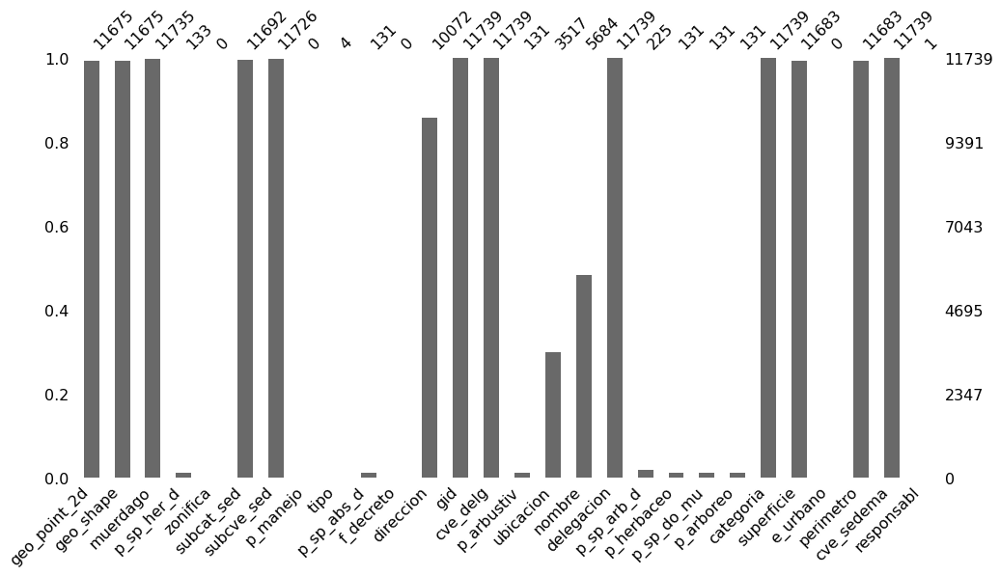

In [25]:
msno.bar(verde_data, figsize=(16,8))

Observamos que hay una gran cantidad de columnas vacías o con muy pocos datos, por lo que tambien las reomveremos.

In [26]:
columnas_a_remover = ['p_sp_her_d','zonifica', 'p_manejo', 'tipo', 'p_sp_abs_d', 'f_decreto','p_arbustiv','ubicacion',
                      'p_sp_arb_d', 'p_herbaceo', 'p_sp_do_mu', 'p_arboreo','e_urbano','responsabl', 'nombre']
verde_data.drop(columnas_a_remover, axis=1, inplace=True)
verde_data.head()

,geo_point_2d,geo_shape,muerdago,subcat_sed,subcve_sed,direccion,gid,cve_delg,delegacion,categoria,superficie,perimetro,cve_sedema
id,,,,,,,,,,,,,
0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Panteones,604.0,Román Álvarez Moreno,268,2,Azcapotzalco,Equipamientos urbanos con vegetación,6660.027554,329.264738,600
1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Deportivos,601.0,Avenida Canal deTezontle,87,8,Iztacalco,Equipamientos urbanos con vegetación,2917.257837,272.243614,600
2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Camellones centrales y laterales,203.0,Canal Río Churubusco,180,8,Iztacalco,Áreas verdes complementarias o ligadas a la re...,1086.305646,425.043656,200
3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,CORTEZA,89,8,Iztacalco,Equipamientos urbanos con vegetación,3605.704046,269.209436,600
4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,El Lago,90,8,Iztacalco,Equipamientos urbanos con vegetación,19619.361577,798.409227,600


Una vez que ya nos hayamos encargado de los datos faltantes, ahora cambiaremos las columnas categoria, delegacion, subcat_sed a tipo de dato categórico

In [27]:
verde_data['categoria'] = verde_data['categoria'].astype('category')
verde_data['delegacion'] = verde_data['delegacion'].astype('category')
verde_data['subcat_sed'] = verde_data['subcat_sed'].astype('category')
verde_data.dtypes

geo_point_2d      object
geo_shape         object
muerdago          object
subcat_sed      category
subcve_sed       float64
direccion         object
gid                int64
cve_delg           int64
delegacion      category
categoria       category
superficie       float64
perimetro        float64
cve_sedema         int64
dtype: object

Buscamos registros duplicados

In [28]:
duplicate_rows_df = verde_data[verde_data.duplicated()]
duplicate_rows_df.shape
print(f'Numero de registros duplicados: {duplicate_rows_df.shape[0]}')

Numero de registros duplicados: 0


Ahora, con el fin de facilitar la visualización, debido a que no tenemos un shapefile, realizaremos unas transformaciones al csv para poder representarlo en el mapa, separando la columna geo_point_2d en dos columnas, latitud y longitud.

In [34]:
#Creamos dos columnas apartir de geo_point_2d
verde_data[['latitud','longitud']] = verde_data['geo_point_2d'].str.split(',',1, expand=True)
verde_data.dropna(axis=0, how='any', thresh=None, subset=['latitud'], inplace=True)
verde_data['latitud'] = verde_data['latitud'].astype(float)
verde_data['longitud'] = verde_data['longitud'].astype(float)

In [35]:
#Confirmamos que se han creado con exito
verde_data.columns

Index(['geo_point_2d', 'geo_shape', 'muerdago', 'subcat_sed', 'subcve_sed',
       'direccion', 'gid', 'cve_delg', 'delegacion', 'categoria', 'superficie',
       'perimetro', 'cve_sedema', 'latitud', 'longitud'],
      dtype='object')

Como aqui ya tenemos más columnas numéricas, utilizaremos el algoritmo de K-Nearest-neighbors(KNN) para detectar outliers.

In [36]:
X = verde_data[['superficie', 'perimetro', 'latitud', 'longitud']] #Filtramos columnas numéricas
clf = KNN(contamination=0.18)
clf.fit(X)
y_pred = clf.predict(X)
X[y_pred == 1].head()

,superficie,perimetro,latitud,longitud
id,,,,
4,19619.361577,798.409227,19.382213,-99.102842
6,118007.516203,1640.132463,19.404204,-99.088981
8,15384.300941,496.864648,19.395776,-99.095960
15,2796.439730,1229.614074,19.377024,-99.069372
27,5326.746438,1005.238044,19.357481,-99.000300


Viendo algunos de los outliers observamos que son areas verdes con superficie muy grande o muy pequeña, al igual que con el perimetro. Pero para fines de este proyecto nos interesa visualizar todos, por lo que no los removeremos

### **Generación de conjuntos de datos y sus diccionarios**

Con los datos que tenemos generaremos dos nuevos conjuntos de datos, el primero será uno que muestre la suma de todos los tiraderos de basura, areas verdes y postes del c5 que hay en cada alcaldía, además le agregaremos la población y el area de cada alcaldía.

El otro conjunto de dato consistirá en unir todos los registros de area verde, postes del c5 y tiraderos clandestinos, con su respectiva latitud y longitud, con el fin de facilitar su visualización.

#### Generación del primer Dataset

In [37]:
data1 = tiradero_data['alcaldia'].value_counts()
df = data1.to_frame().reset_index(level=0)
df.rename(columns={'index': 'alcaldia', 'alcaldia': 'tiraderos'}, inplace=True)
df

,alcaldia,tiraderos
0,Cuauhtemoc,274
1,Iztapalapa,219
2,Benito Juarez,147
3,Venustiano Carranza,109
4,Alvaro Obregon,77
5,Miguel Hidalgo,69
6,Coyoacan,68
7,Iztacalco,47
8,Azcapotzalco,47
9,Tlahuac,35


In [38]:
data2 = verde_data['delegacion'].value_counts()
df2 = data2.to_frame().reset_index(level=0)
df2.rename(columns={'index': 'alcaldia', 'delegacion': 'areas_verdes'}, inplace=True)

mapper = {"Iztapalapa": "Iztapalapa",
          "Coyoacán": "Coyoacan",
          "Azcapotzalco": "Azcapotzalco",
          "Miguel Hidalgo": "Miguel Hidalgo",
          "Tlalpan":"Tlalpan",
          "Álvaro Obregón": "Alvaro Obregon",
          "Venustiano Carranza":"Venustiano Carranza",
          "Tláhuac":"Tlahuac",
          "Cuauhtémoc":"Cuauhtemoc",
          "Benito Juárez":"Benito Juarez",
          "Cuajimalpa de Morelos":"Cuajimalpa",
          "Iztacalco":"Iztacalco",
          "Magdalena Contreras": "Magdalena Contreras",
          "Xochimilco":"Xochimilco",
          "Milpa Alta":"Milpa Alta"}

df2.replace({"alcaldia": mapper}, inplace=True)
df2

,alcaldia,areas_verdes
0,Iztapalapa,2098
1,Coyoacan,1802
2,Azcapotzalco,948
3,Miguel Hidalgo,925
4,Gustavo A. Madero,835
5,Tlalpan,735
6,Alvaro Obregon,721
7,Venustiano Carranza,630
8,Tlahuac,576
9,Cuauhtemoc,566


In [39]:
data3 = internet_cdmx['Alcaldía'].value_counts()
df3 = data3.to_frame().reset_index(level=0)
df3.rename(columns={'index': 'alcaldia', 'Alcaldía': 'puntos_wifi'}, inplace=True)
mapper = {"IZTAPALAPA": "Iztapalapa",
          "COYOACÁN": "Coyoacan",
          "AZCAPOTZALCO": "Azcapotzalco",
          "MIGUEL HIDALGO": "Miguel Hidalgo",
          "TLALPAN":"Tlalpan",
          "ÁLVARO OBREGÓN": "Alvaro Obregon",
          "VENUSTIANO CARRANZA":"Venustiano Carranza",
          "TLÁHUAC":"Tlahuac",
          "CUAUHTÉMOC":"Cuauhtemoc",
          "BENITO JUÁREZ":"Benito Juarez",
          "CUAJIMALPA DE MORELOS":"Cuajimalpa",
          "IZTACALCO":"Iztacalco",
          "LA MAGDALENA CONTRERAS": "Magdalena Contreras",
          "XOCHIMILCO":"Xochimilco",
          "MILPA ALTA":"Milpa Alta",
          "GUSTAVO A. MADERO": "Gustavo A. Madero"}

df3.replace({"alcaldia": mapper}, inplace=True)
df3

,alcaldia,puntos_wifi
0,Iztapalapa,2160
1,Tlalpan,2053
2,Cuauhtemoc,1967
3,Gustavo A. Madero,1836
4,Alvaro Obregon,1786
5,Coyoacan,1711
6,Miguel Hidalgo,1476
7,Azcapotzalco,1355
8,Benito Juarez,1350
9,Venustiano Carranza,1011


In [43]:
df_temp = pd.merge(df,df2,on='alcaldia',how='outer')
df_completo = pd.merge(df_temp,df3,on='alcaldia',how='outer')
df_completo.fillna(0, inplace= True)
df_completo=df_completo.rename(columns = {'puntos_wifi':'postes_c5'})
df_completo

,alcaldia,tiraderos,areas_verdes,postes_c5
0,Cuauhtemoc,274.0,566,1967
1,Iztapalapa,219.0,2098,2160
2,Benito Juarez,147.0,484,1350
3,Venustiano Carranza,109.0,630,1011
4,Alvaro Obregon,77.0,721,1786
5,Miguel Hidalgo,69.0,925,1476
6,Coyoacan,68.0,1802,1711
7,Iztacalco,47.0,386,850
8,Azcapotzalco,47.0,948,1355
9,Tlahuac,35.0,576,564


Por ultimo, agregamos la población y la superficie (en km^2) para cada delegación

In [44]:
poblacion = pd.Series([545884, 1835486, 434153, 443704, 759137, 414470, 614447, 432205, 404695, 392313, 152685, 442178, 217686, 247622, 699928, 1173351])
superficie = pd.Series([32.40, 117.00, 26.63, 33.40, 96.17, 46.99,  54.40, 33.66, 23.30, 85.34, 228.41, 122.00, 74.58, 74.58, 312, 94.07])

Los agregamos como columnas al Dataframe

In [45]:
df_completo['poblacion'] = poblacion
df_completo['superficie'] = superficie

In [46]:
df_completo

,alcaldia,tiraderos,areas_verdes,postes_c5,poblacion,superficie
0,Cuauhtemoc,274.0,566,1967,545884,32.40
1,Iztapalapa,219.0,2098,2160,1835486,117.00
2,Benito Juarez,147.0,484,1350,434153,26.63
3,Venustiano Carranza,109.0,630,1011,443704,33.40
4,Alvaro Obregon,77.0,721,1786,759137,96.17
5,Miguel Hidalgo,69.0,925,1476,414470,46.99
6,Coyoacan,68.0,1802,1711,614447,54.40
7,Iztacalco,47.0,386,850,432205,33.66
8,Azcapotzalco,47.0,948,1355,404695,23.30
9,Tlahuac,35.0,576,564,392313,85.34


In [47]:
#Exportamos en formato csv
df_completo.to_csv('datos_alcaldias.csv')

#### Diccionario del primer Dataset

El diccionario de datos para el primer dataset generado se encuentra disponible en el [siguiente link](https://github.com/carlosvelv/proyecto_integrador/blob/main/diccionario_datos/diccionario_datos_alcaldias.xlsx), e incluye la descripción de cada variable junto con su tipo de dato.

#### Generación del segundo Dataset

Aqui juntaremos todos los registros individuales de areas verdes, postes c5, y tiraderos clandestinos con sus coordenadas con el fin de facilitar su visulaización

In [48]:
visualizacion_data_tiradero = pd.DataFrame()
visualizacion_data_tiradero['longitud'] = tiradero_data['longitud']
visualizacion_data_tiradero['latitud'] = tiradero_data['latitud']
visualizacion_data_tiradero['tipo'] = 'tiradero'

visualizacion_data_verde = pd.DataFrame()
visualizacion_data_verde['longitud'] = verde_data['longitud']
visualizacion_data_verde['latitud'] = verde_data['latitud']
visualizacion_data_verde['tipo'] = 'area verde'

visualizacion_data_c5 = pd.DataFrame()
visualizacion_data_c5['longitud'] = c5_data['Longitud']
visualizacion_data_c5['latitud'] = c5_data['Latitud']
visualizacion_data_c5['tipo'] = 'poste c5'

In [49]:
datos_visualizacion = pd.concat([visualizacion_data_tiradero, visualizacion_data_verde, visualizacion_data_c5])

In [50]:
datos_visualizacion.reset_index(drop=True, inplace=True)

In [51]:
datos_visualizacion

,longitud,latitud,tipo
0,-99.139980,19.367720,tiradero
1,-99.042876,19.203210,tiradero
2,-99.055393,19.296997,tiradero
3,-99.107160,19.300200,tiradero
4,-99.054197,19.302147,tiradero
...,...,...,...
26513,-99.099560,19.442320,poste c5
26514,-99.096330,19.447540,poste c5
26515,-99.085930,19.412320,poste c5
26516,-99.087090,19.409450,poste c5


In [52]:
#Transformando a csv
datos_visualizacion.to_csv('datos_visualizacion.csv')

#### Diccionario del segundo Dataset


El diccionario de datos para el primer dataset generado se encuentra disponible en el [siguiente link](https://github.com/carlosvelv/proyecto_integrador/blob/main/diccionario_datos/diccionario_datos_visualizacion.xlsx), e incluye la descripción de cada variable junto con su tipo de dato.

### **Analisis de Datos Exploratorio(EDA)**

In [53]:
datasets = {"Internet Espacio Publico": internet_data,
            "Internet Mi-Barrio": mibarrio_data,
            "Internet Postes C5":c5_data,
            "Internet Pilares": pilares_data,
            "Areas Verdes": verde_data,
            "Tiraderos clandestinos": tiradero_data}
for k,v in datasets.items():
  print("-" * 25)
  print(f"Dimensiones del Dataset {k}:")
  print(f"Registros: {v.shape[0]}")
  print(f"Columnas: {v.shape[1]}")
  print("-" * 25)

-------------------------
Dimensiones del Dataset Internet Espacio Publico:
Registros: 100
Columnas: 6
-------------------------
-------------------------
Dimensiones del Dataset Internet Mi-Barrio:
Registros: 5935
Columnas: 6
-------------------------
-------------------------
Dimensiones del Dataset Internet Postes C5:
Registros: 13714
Columnas: 6
-------------------------
-------------------------
Dimensiones del Dataset Internet Pilares:
Registros: 217
Columnas: 6
-------------------------
-------------------------
Dimensiones del Dataset Areas Verdes:
Registros: 11675
Columnas: 15
-------------------------
-------------------------
Dimensiones del Dataset Tiraderos clandestinos:
Registros: 1129
Columnas: 10
-------------------------


#### EDA de Dataset de puntos de servicio de Wifi gratuito en la CDMX

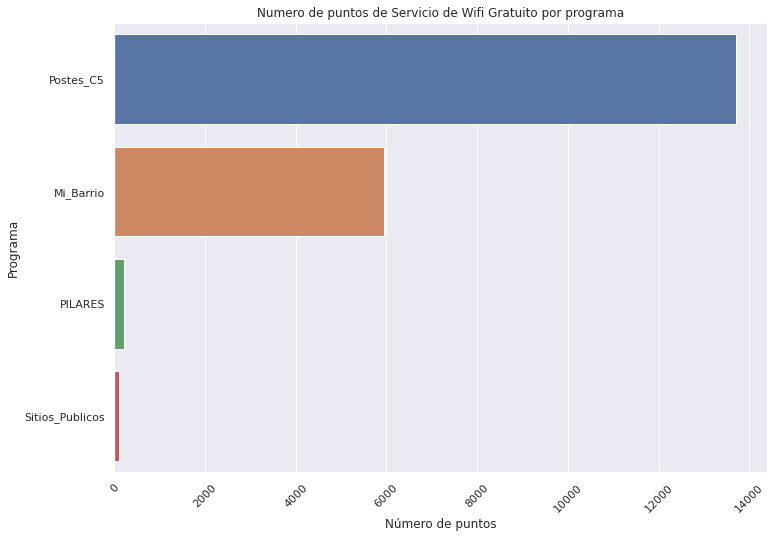

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = internet_cdmx, y = 'Programa', orient='h', order = ['Postes_C5', 'Mi_Barrio', "PILARES", "Sitios_Publicos"])
plt.title('Numero de puntos de Servicio de Wifi Gratuito por programa')
plt.xticks(rotation = 45)
plt.xlabel('Número de puntos')
plt.show()

Como se puede observar el programa de servicio de Wifi gratuito de postes C5 es el que mas presenta puntos de servicio, seguido por el programa MiBarrio y por ultimo PILARES y Wifi en sitios públicos.

Posteriormente compararemos el numero de puntos de servicio de Wifi Gratuito por alcaldía.

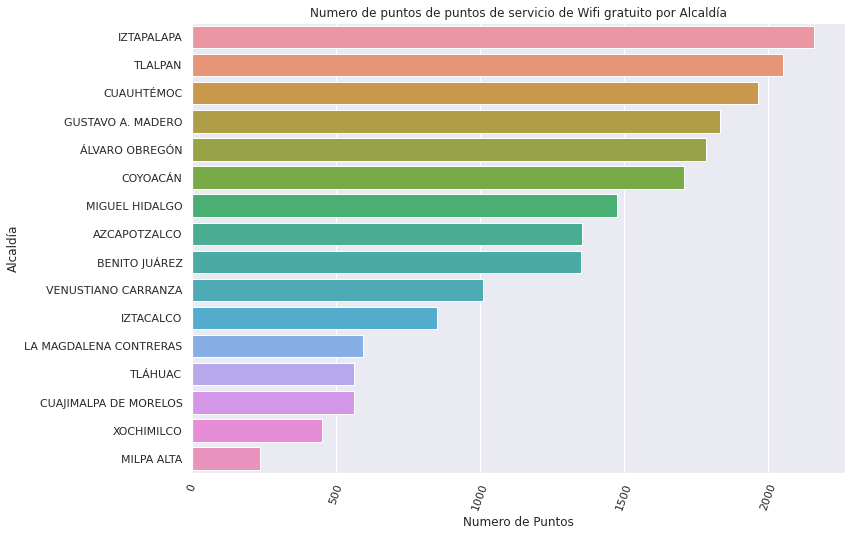

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = internet_cdmx, y = 'Alcaldía', order=internet_cdmx['Alcaldía'].value_counts().index)
plt.title('Numero de puntos de puntos de servicio de Wifi gratuito por Alcaldía')
plt.xticks(rotation =70)
plt.xlabel('Numero de Puntos')
plt.show()

Vemos que las alcaldías que mas tienen acceso a internet gratuito son iztapalapa, tlalpan y cuahutemoc. Por otro lado las que menos tienen sitios de Wifi gratuito son xochimilco y milpa alta. Y para ver que tantos puntos de servicio tienen de cada programa podemos hacer lo siguiente:

In [ ]:
separados = internet_cdmx.groupby(['Alcaldía', 'Programa'])['Puntos_de_acceso'].count().unstack().fillna(0)

separados.head()

Programa,Mi_Barrio,PILARES,Postes_C5,Sitios_Publicos
Alcaldía,,,,
AZCAPOTZALCO,628.0,11.0,708.0,8.0
BENITO JUÁREZ,554.0,3.0,790.0,3.0
COYOACÁN,793.0,11.0,901.0,6.0
CUAJIMALPA DE MORELOS,323.0,5.0,234.0,1.0
CUAUHTÉMOC,480.0,14.0,1455.0,18.0


In [ ]:
#Separando por alcaldia y programa
separados = internet_cdmx.groupby(['Alcaldía', 'Programa'])['Puntos_de_acceso'].count().unstack().fillna(0)
separados.columns = separados.columns.astype(str)
separados['Total'] = separados.sum(axis=1)
separados.sort_values('Total', inplace=True, ascending=True)

(array([   0.,  500., 1000., 1500., 2000., 2500.]),
 <a list of 6 Text major ticklabel objects>)

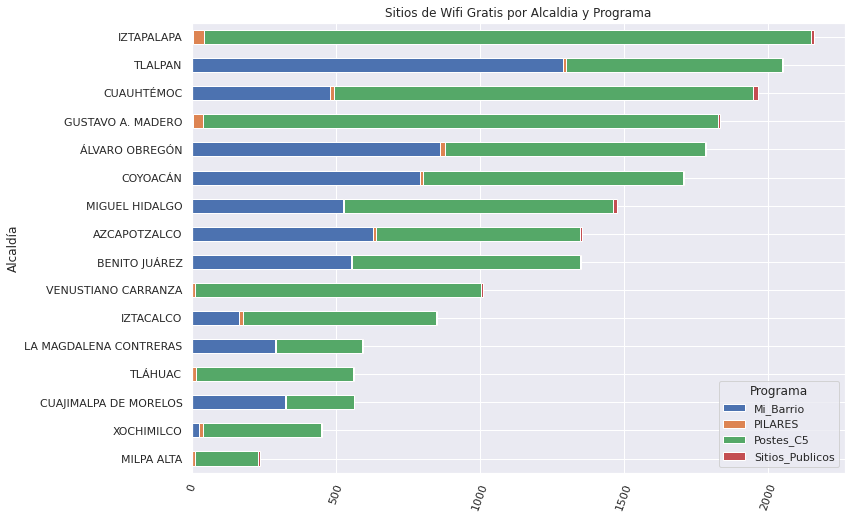

In [ ]:
#Graficando
separados[['Mi_Barrio', "PILARES", "Postes_C5", "Sitios_Publicos"]].plot(kind='barh', stacked=True, figsize=((11.7,8.27)))
plt.title('Sitios de Wifi Gratis por Alcaldia y Programa')
plt.xticks(rotation=70, ha='center')

Vemos en la grafica que unas alcaldías tienen principalmente puntos de servicio  Wifi Gratuito con los postes C5 (tales como Iztapalapa y Venustiano Carranza) y otros con los del programa Mi-Barrio ( como Tlalpan y Alvaro Obregon).

Seguido de esto, analizando el numero de puntos de acceso para cada uno de los puntos de servicio proporcionados por cada programa, vemos que PILARES y Puntos de servicio en sitios públicos son los que ofrecen mas de un punto de acceso, como se puede ver en la siguiente gráfica. 

Text(0.5, 1.0, 'Distribución de puntos de acceso por puntos de servicio de Wifi gratuito')

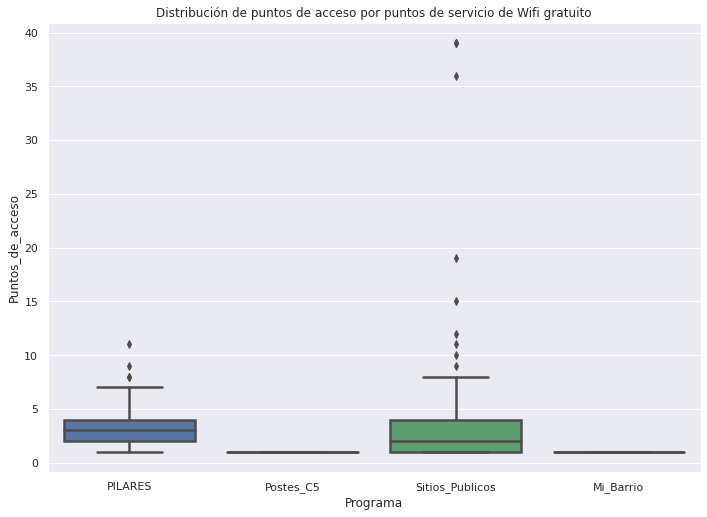

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.boxplot(x="Programa", y="Puntos_de_acceso", data=internet_cdmx, linewidth=2.5)
ax.set_title('Distribución de puntos de acceso por puntos de servicio de Wifi gratuito')

En un principio en este proyecto se tenía contemplado ver la relación entre los puntos de Wifi gratuitos, áreas verdes y tiraderos clandestinos, sin embargo conforme se fue progresando el proyecto tendió a encaminarse más a los postes del C5 en sí y no tanto a los puntos de Wifi gratuitos. Por lo que a partir de este punto se trabajará con el dataset de c5_data y no con el de internet_cdmx

In [ ]:
c5_data.head()

,ID,Colonia,Alcaldía,Latitud,Longitud,Puntos_de_acceso,Programa
0,1,CENTRO,CUAUHTÉMOC,19.43528,-99.14715,1,Postes_C5
1,2,CENTRO,CUAUHTÉMOC,19.43510,-99.14582,1,Postes_C5
2,3,CENTRO,CUAUHTÉMOC,19.43457,-99.14386,1,Postes_C5
3,4,CENTRO,CUAUHTÉMOC,19.43437,-99.14270,1,Postes_C5
4,5,CENTRO,CUAUHTÉMOC,19.43424,-99.14188,1,Postes_C5


Graficaremos la ubicación de los postes del C5 en un mapa de la CDMX

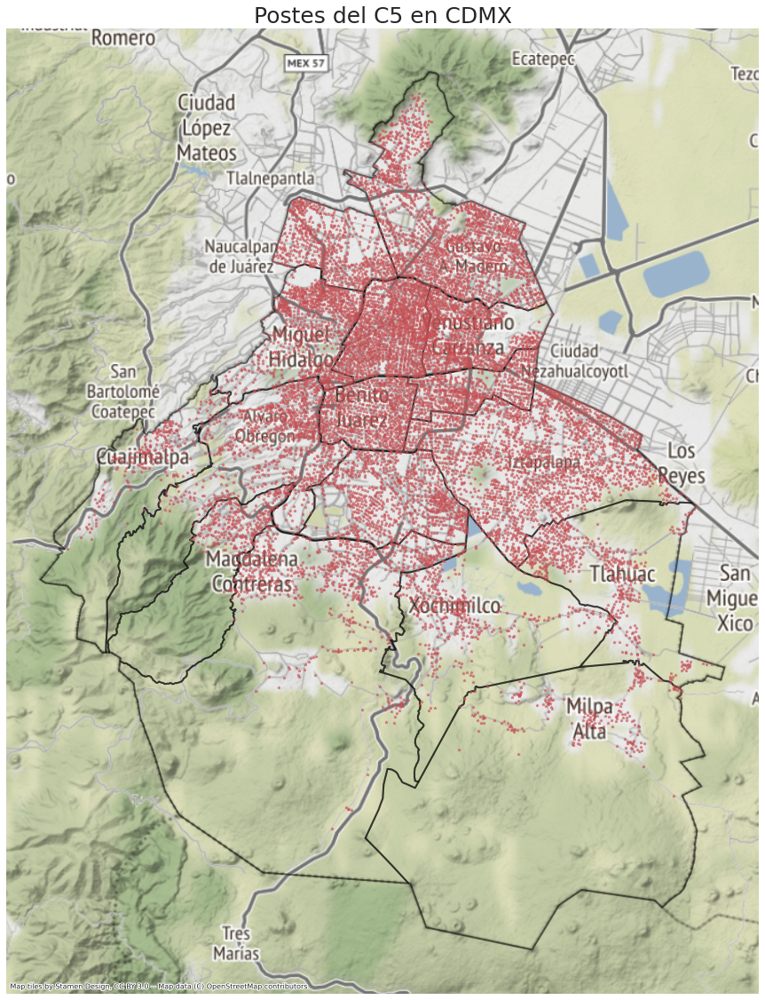

In [ ]:
gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (20,20),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Postes del C5 en CDMX',
          fontsize = 25)
x, y = c5_data['Longitud'].values, c5_data['Latitud'].values
ax.scatter(x, y, marker="*", color='r', alpha=0.5, zorder=5, s=10)
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.savefig('figura_anexo3.png')

Observamos que, como es de esperarse con las gráficas que vimos anteriorimente, hay una mayor cantidad de postes del C5 en las alcaldías de Itzapalapa, Gustavo A. Madero y Cuauhtemoc, en la parte centro de la CDMX.

#### EDA del dataset de tiraderos de basura clandestinos

Primero observaremos en que delegaciones hay mayor cantidad de tiraderos de basura clandestinos.

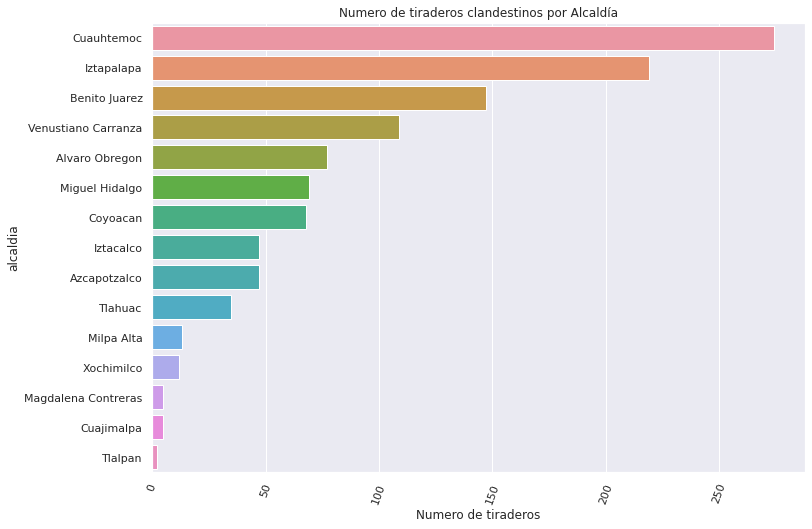

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = tiradero_data, y = 'alcaldia', order=tiradero_data['alcaldia'].value_counts().index)
plt.title('Numero de tiraderos clandestinos por Alcaldía')
plt.xticks(rotation =70)
plt.xlabel('Numero de tiraderos')
plt.show()

Haciendo uso de Pandas podemos filtrar para ver cuales son las colonias de la delegación Cuauhtemoc en las que mas tiraderos clandestinos hay. Esto se puede repetir para cada Delegación

Text(0.5, 1.0, 'Principales colonias con tiraderos clandestinos en delegación Cuauhtemoc')

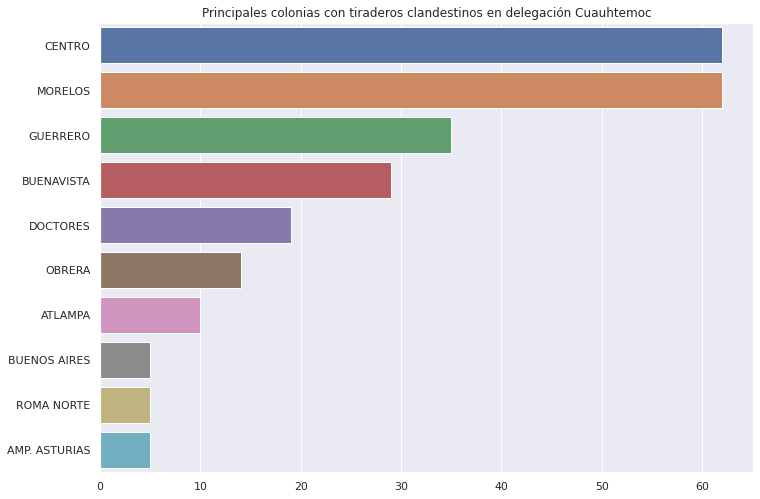

In [ ]:
tiradero_filtrado = tiradero_data[tiradero_data['alcaldia'] == 'Cuauhtemoc']
top_10 = tiradero_filtrado['colonia'].value_counts(ascending=False)[:10]
sns.barplot(y = top_10.index, x = top_10.values)
plt.title('Principales colonias con tiraderos clandestinos en delegación Cuauhtemoc')


Posteriormente, observaremos en el mapa como se encuentran distribuidos estos tiraderos

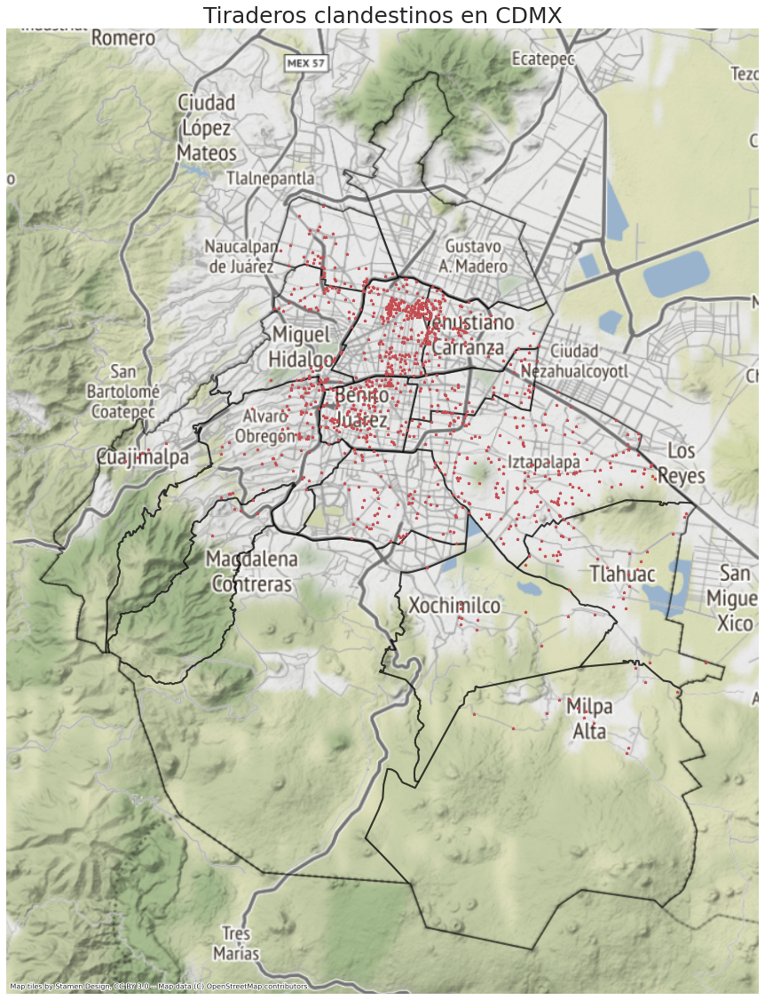

In [ ]:
gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (20,20),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Tiraderos clandestinos en CDMX',
          fontsize = 25)
x, y = tiradero_data['longitud'].values, tiradero_data['latitud'].values
ax.scatter(x, y, marker="*", color='r', alpha=1, zorder=5, s=10)
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.savefig('figura_anexo2.png')

Esto ya nos permite visualizar donde se concentran estos tiraderos clandestinos, lo cual confirma lo que vimos en los gráficos de barras, que principalmente se concentran en las delegaciones de Cuauhtémoc, Iztapalapa y Benito Juárez, algo que destaca es que no hay registros en el Dataset de tiraderos clandestinos ubicacdos en la delegación Gustavo A. Madero.

#### EDA Dataset Areas Verdes

In [ ]:
verde_data.head()

,id,geo_point_2d,geo_shape,muerdago,subcat_sed,subcve_sed,direccion,gid,cve_delg,delegacion,categoria,superficie,perimetro,cve_sedema,latitud,longitud
0,0,"19.4877568178,-99.2060645931","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Panteones,604.0,Román Álvarez Moreno,268,2,Azcapotzalco,Equipamientos urbanos con vegetación,6660.027554,329.264738,600,19.487757,-99.206065
1,1,"19.3887689803,-99.116393168","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Deportivos,601.0,Avenida Canal deTezontle,87,8,Iztacalco,Equipamientos urbanos con vegetación,2917.257837,272.243614,600,19.388769,-99.116393
2,2,"19.3928871121,-99.0869912505","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Camellones centrales y laterales,203.0,Canal Río Churubusco,180,8,Iztacalco,Áreas verdes complementarias o ligadas a la re...,1086.305646,425.043656,200,19.392887,-99.086991
3,3,"19.383106069,-99.1073609486","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,CORTEZA,89,8,Iztacalco,Equipamientos urbanos con vegetación,3605.704046,269.209436,600,19.383106,-99.107361
4,4,"19.3822134465,-99.1028423436","{""type"": ""MultiPolygon"", ""coordinates"": [[[[-9...",Ausencia,Unidades habitacionales,602.0,El Lago,90,8,Iztacalco,Equipamientos urbanos con vegetación,19619.361577,798.409227,600,19.382213,-99.102842


Primero veremos cuales son las principales categorías de Areas verdes en la CDMX

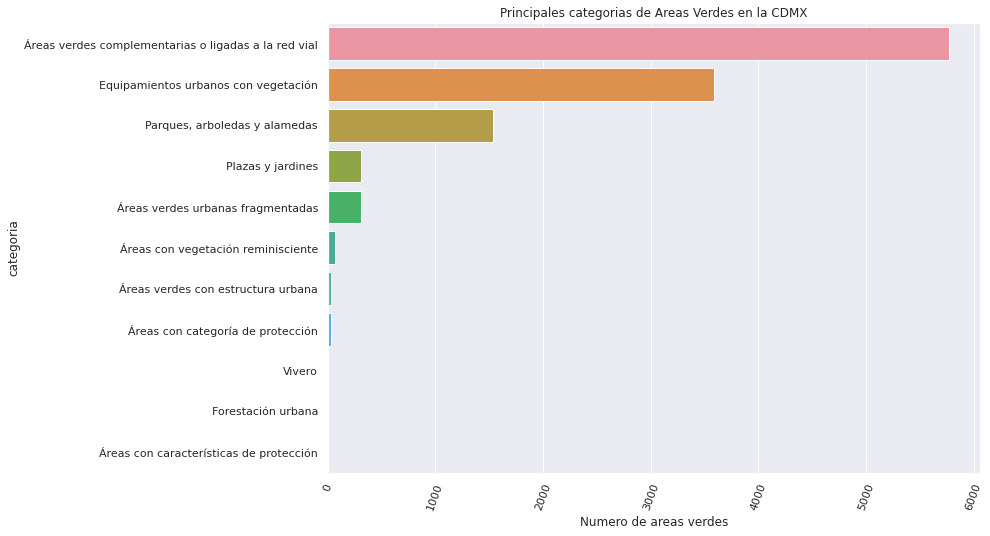

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = verde_data, y = 'categoria', order=verde_data['categoria'].value_counts().index)
plt.title('Principales categorias de Areas Verdes en la CDMX')
plt.xticks(rotation =70)
plt.xlabel('Numero de areas verdes')
plt.show()

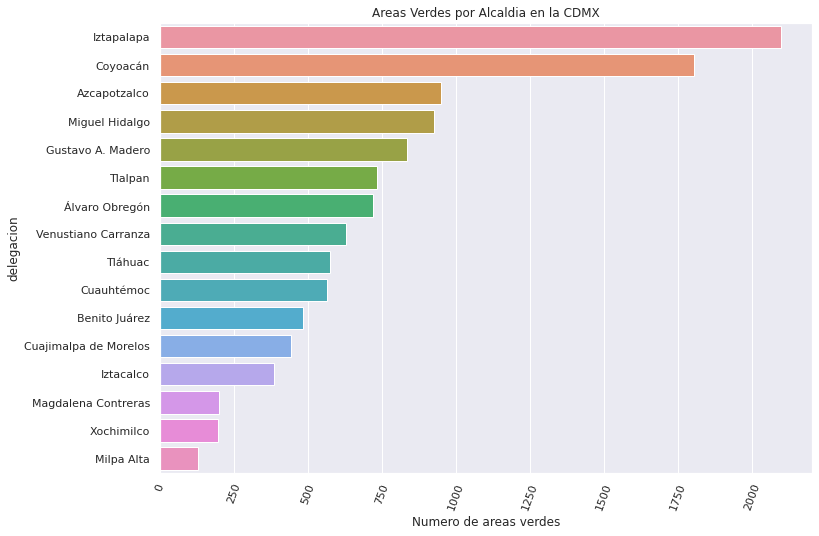

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.countplot(data = verde_data, y = 'delegacion', order=verde_data['delegacion'].value_counts().index)
plt.title('Areas Verdes por Alcaldia en la CDMX')
plt.xticks(rotation =70)
plt.xlabel('Numero de areas verdes')
plt.show()

Despues analizamos la distribución de perimetro y superficie de areas verdes por alcaldía

(0.0, 5000.0)

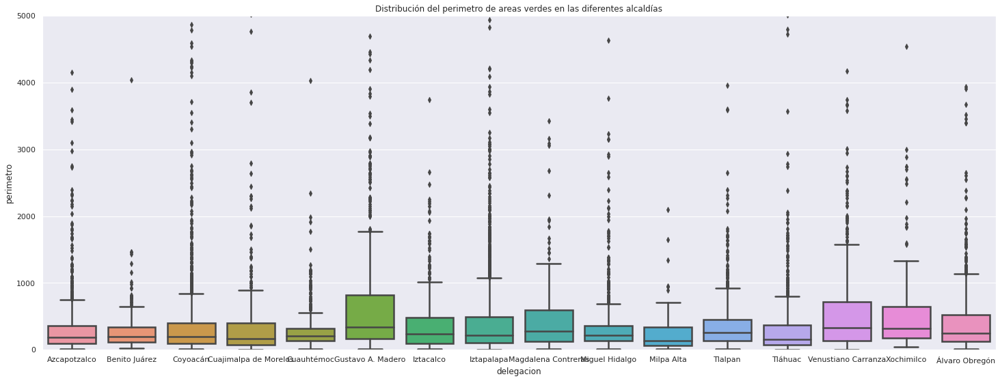

In [ ]:
sns.set(rc={'figure.figsize':(25,9)})
ax = sns.boxplot(x="delegacion", y="perimetro", data=verde_data, linewidth=2.5)
ax.set_title('Distribución del perimetro de areas verdes en las diferentes alcaldías')
plt.ylim(0, 5000)

(0.0, 40000.0)

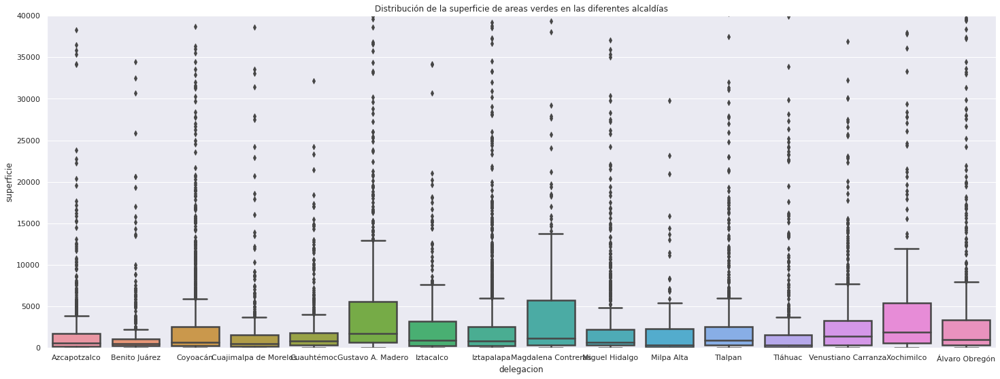

In [ ]:
sns.set(rc={'figure.figsize':(25,9)})
ax = sns.boxplot(x="delegacion", y="superficie", data=verde_data, linewidth=2.5)
ax.set_title('Distribución de la superficie de areas verdes en las diferentes alcaldías')
plt.ylim(0, 40000)

Como vimos en la sección de limpieza de datos, hay una gran cantidad de outliers, pero con el gráfico ya nos damos la idea de como es la distribución de superficies y perimetros de areas verdes para cada delegación

Ahora veremos de manera gráfica donde se encuentran esas areas verdes

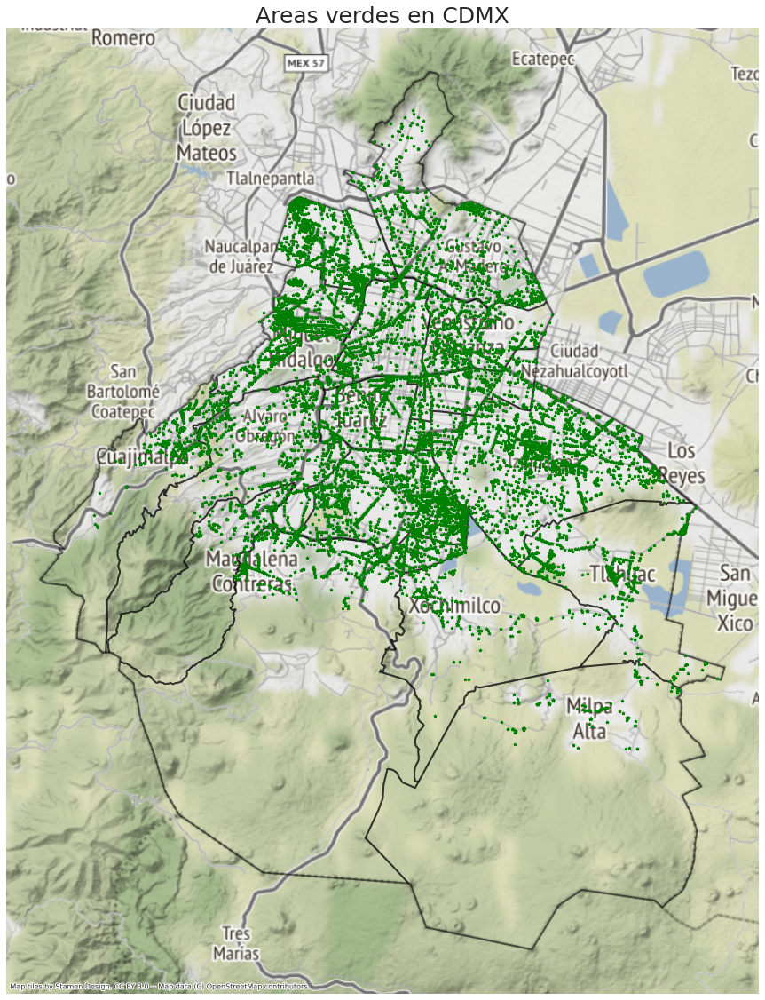

In [ ]:
gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (20,20),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Areas verdes en CDMX',
          fontsize = 25)
x, y = verde_data['longitud'].values, verde_data['latitud'].values
ax.scatter(x, y, marker="*", color='green', alpha=1, zorder=5, s=10)
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.savefig('figura_anexo1.png')

En este podemos ver que, a diferencia de los datasets anteriores, no se concentran solo en el centro de la CDMX, si no que tambien entran otras delegaciones como Coyoacán y Azcapotzalco

#### EDA Conjuntos de datos generados

Para el primer conjunto, en el cual tenemos la suma de cada una de sus areas verdes, postes c5, tiraderos clandestinos, población y superficie para cada una de sus alcaldías, podemos ver la correlación entre sus variables.

In [54]:
df_completo.head(2)

,alcaldia,tiraderos,areas_verdes,postes_c5,poblacion,superficie
0,Cuauhtemoc,274.0,566,1967,545884,32.4
1,Iztapalapa,219.0,2098,2160,1835486,117.0


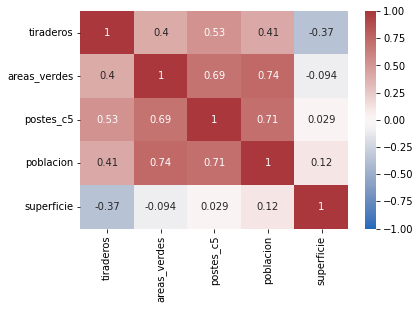

In [55]:
sns.heatmap(df_completo.corr(),
            vmin = -1,
            vmax = 1,
            cmap = 'vlag',
            annot = True)

Observamos que hay una ligera correlación negativa entre tiraderos y superficie, esto puede ser debido a que los tiraderos clandestinos como vimos en los EDA anteriores, se concentran en el centro de la CDMX, y algunas de las alcaldías mas grandes están en el exterior de la CDMX. 
Tambien vemos que hay una correlación positiva entre población y areas verdes, población y postes C5, esto es una buena señal ya que indica que donde hay mayor población hay mayor cantidad de postes C5.

Para el segundo conjunto ahora veremos en un mapa como están distribuidas las areas verdes, los postes c5 y los tiraderos clandestinos todo en un mismo mapa.

In [ ]:
datos_visualizacion.tail()


,longitud,latitud,tipo
26513,-99.09956,19.44232,poste c5
26514,-99.09633,19.44754,poste c5
26515,-99.08593,19.41232,poste c5
26516,-99.08709,19.40945,poste c5
26517,-99.09224,19.40880,poste c5


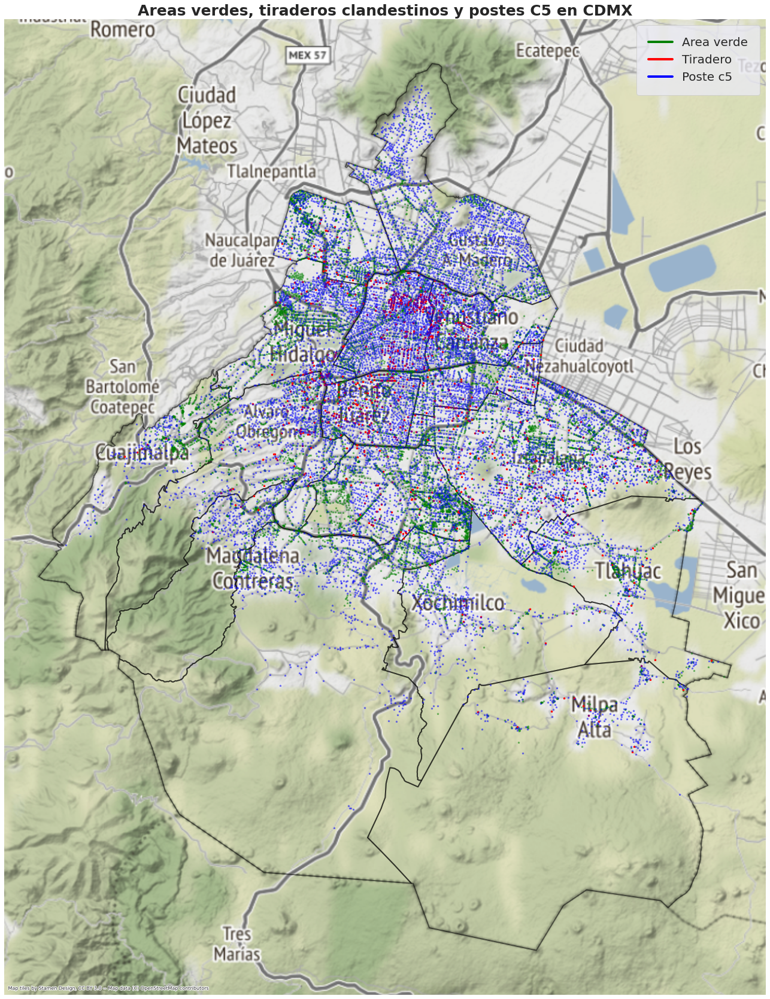

In [ ]:
gdf = geopandas.read_file('/content/alcaldias.shp')
ax = gdf.plot(figsize = (30,30),
              edgecolor="black",
              #cmap='Pastel1',
              facecolor="none",
              #color = 'red',
              alpha=0.5,
              linewidth=2)
ax.axis('off')
plt.title('Areas verdes, tiraderos clandestinos y postes C5 en CDMX',
          fontsize = 25,
          fontweight='bold')


verde = datos_visualizacion[datos_visualizacion['tipo'] == 'area verde']
x, y = verde['longitud'].values, verde['latitud'].values
ax.scatter(x, y, marker="*", color= 'green', alpha=0.4, zorder=5, s=10)

rojo = datos_visualizacion[datos_visualizacion['tipo'] == 'tiradero']
x, y = rojo['longitud'].values, rojo['latitud'].values
ax.scatter(x, y, marker="*", color= 'red', alpha=1, zorder=5, s=10)

azul = datos_visualizacion[datos_visualizacion['tipo'] == 'poste c5']
x, y = azul['longitud'].values, azul['latitud'].values
ax.scatter(x, y, marker="*", color= 'blue', alpha=0.4, zorder=5, s=10)

from matplotlib.patches import Patch
legend_elements = [Line2D([0], [0], color='green', lw=4, label='Area verde'),
                   Line2D([0], [0], color='red', lw=4, label='Tiradero'),
                   Line2D([0], [0], color='blue', lw=4, label='Poste c5'),]

ax.legend(handles = legend_elements, prop={'size': 20}, borderpad=1)
cx.add_basemap(ax, crs=gdf.crs.to_string())
plt.savefig('figura_reporte_final.png')

Con esto ya podemos ver toda la información integrada en un mismo mapa, sin embargo para poder ver si las camaras de los postes del C5 podrían usarse como medida preventiva de tiraderos clandestinos de basura, lo ideal es tener un mapa mas interactivo, en el cual se pueda apreciar mejor.

### **Visualizacion de la informacion utilizando un metodo de reducción de caracteristicas(PCA, t-SNE)**

#### Análisis en Componentes Principales (PCA)

Ahora realizaremos un análisis en Compomnentes principales para el siguiente dataset que generamos (Solo se muestran los primeros 5 registros)

In [ ]:
df_completo.head()

,alcaldia,tiraderos,areas_verdes,puntos_wifi,poblacion,superficie
0,Cuauhtemoc,274.0,566,1967,545884,32.40
1,Iztapalapa,219.0,2098,2160,1835486,117.00
2,Benito Juarez,147.0,484,1350,434153,26.63
3,Venustiano Carranza,109.0,630,1011,443704,33.40
4,Alvaro Obregon,77.0,721,1786,759137,96.17


In [ ]:
#Llenamos los missing values para que no haya problemas con estandarizacion
df_completo = df_completo.fillna(0)

# Se divide el dataset en dos partes
X = df_completo.iloc[:,1:5].values
y = df_completo.iloc[:,0].values

#Estandarizamos
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X)

# Calculamos la matriz de covarianza
print('NumPy covariance matrix: \n%s' %np.cov(X_std.T))

#Calculamos los autovalores y autovectores de la matriz
cov_mat = np.cov(X_std.T)
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

#  Hacemos una lista de parejas (autovector, autovalor) 
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Ordenamos estas parejas den orden descendiente 
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visualizamos la lista de autovalores en orden desdenciente
print('Autovalores en orden descendiente:')
for i in eig_pairs:
    print(i[0])

NumPy covariance matrix: 
[[1.06666667 0.43010936 0.56161505 0.43861261]
 [0.43010936 1.06666667 0.73470873 0.79451924]
 [0.56161505 0.73470873 1.06666667 0.75896294]
 [0.43861261 0.79451924 0.75896294 1.06666667]]
Eigenvectors 
[[-0.4012683  -0.88497984  0.22798751  0.06177481]
 [-0.52244569  0.33662748  0.54075213 -0.56685058]
 [-0.53540446  0.01767298 -0.80278135 -0.26186224]
 [-0.52856061  0.32121688  0.10559799  0.77864784]]

Eigenvalues 
[2.95376647 0.73264571 0.31243704 0.26781745]
Autovalores en orden descendiente:
2.9537664676599102
0.7326457078339977
0.31243703826980324
0.26781745290295544


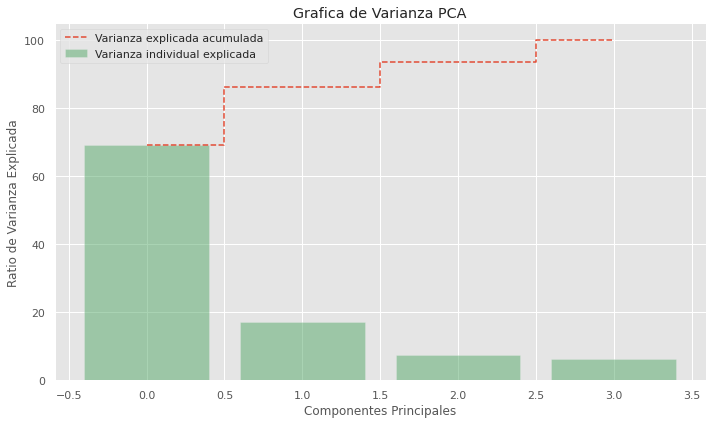

In [ ]:
# A partir de los autovalores, calculamos la varianza explicada
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# Representamos en un diagrama de barras la varianza explicada por cada autovalor, y la acumulada
with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 6))

    plt.bar(range(4), var_exp, alpha=0.5, align='center',
            label='Varianza individual explicada', color='g')
    plt.step(range(4), cum_var_exp, where='mid', linestyle='--', label='Varianza explicada acumulada')
    plt.ylabel('Ratio de Varianza Explicada')
    plt.xlabel('Componentes Principales')
    plt.title('Grafica de Varianza PCA')
    plt.legend(loc='best')
    plt.tight_layout()

Como se puede ver en la gráfica, con 3 componentes principales se explica un poco más del 90% de la varianza de la matriz, sin embargo elegiremos los primeros dos para visualizarlo.

Matriz W:
 [[-0.4012683  -0.88497984]
 [-0.52244569  0.33662748]
 [-0.53540446  0.01767298]
 [-0.52856061  0.32121688]]


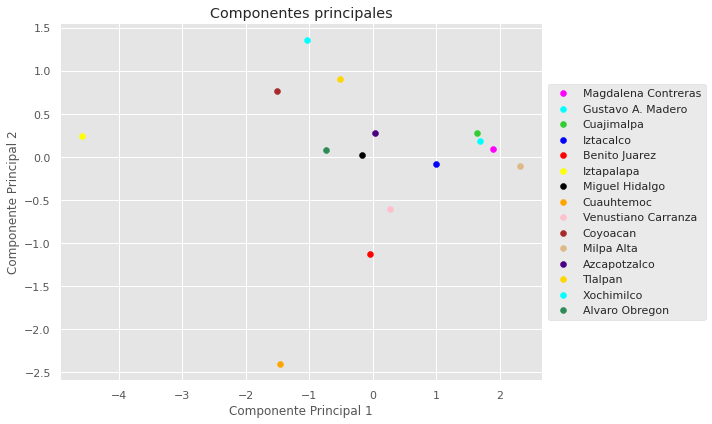

In [ ]:
#Generamos la matríz a partir de los pares autovalor-autovector
matrix_w = np.hstack((eig_pairs[0][1].reshape(4,1),
                      eig_pairs[1][1].reshape(4,1)))

print('Matriz W:\n', matrix_w)

Y = X_std.dot(matrix_w)



with plt.style.context('ggplot'):
    plt.figure(figsize=(10, 6))
    for lab, col in zip(set(y),
                        ('magenta', 'cyan', 'limegreen', 'blue', 'red', 'yellow', 'black', 'orange', 'pink', 'brown', 'burlywood', 'indigo', 'gold', 'cyan',
                         'seagreen')):
        plt.scatter(Y[y==lab, 0],
                    Y[y==lab, 1],
                    label=lab,
                    c=col)
    plt.xlabel('Componente Principal 1')
    plt.ylabel('Componente Principal 2')
    plt.title('Componentes principales')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show() 

Al ver el gráfico ya nos podemos dar ciertas ideas, por ejemplo que Iztapalapa es diferente a las otras delegaciones o que Gustavo A. Madero y Cuajimalpa son muy parecidos, que se puede confirmar viendo el dataset.

In [ ]:
df_completo

,alcaldia,tiraderos,areas_verdes,puntos_wifi,poblacion,superficie
0,Cuauhtemoc,274.0,566,1967,545884,32.40
1,Iztapalapa,219.0,2098,2160,1835486,117.00
2,Benito Juarez,147.0,484,1350,434153,26.63
3,Venustiano Carranza,109.0,630,1011,443704,33.40
4,Alvaro Obregon,77.0,721,1786,759137,96.17
5,Miguel Hidalgo,69.0,925,1476,414470,46.99
6,Coyoacan,68.0,1802,1711,614447,54.40
7,Iztacalco,47.0,386,850,432205,33.66
8,Azcapotzalco,47.0,948,1355,404695,23.30
9,Tlahuac,35.0,576,564,392313,85.34


#### t-Distributed Stochastic Neighbor Embedding (t-SNE)

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 15 nearest neighbors...
[t-SNE] Indexed 16 samples in 0.001s...
[t-SNE] Computed neighbors for 16 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 16 / 16
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.123573
[t-SNE] KL divergence after 300 iterations: 0.610627
t-SNE done! Time elapsed: 0.06666421890258789 seconds


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [ ]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=500)
X_embedded = tsne.fit_transform(X)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 15 nearest neighbors...
[t-SNE] Indexed 16 samples in 0.000s...
[t-SNE] Computed neighbors for 16 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 16 / 16
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.523407
[t-SNE] KL divergence after 500 iterations: 0.353679
t-SNE done! Time elapsed: 0.10102391242980957 seconds


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


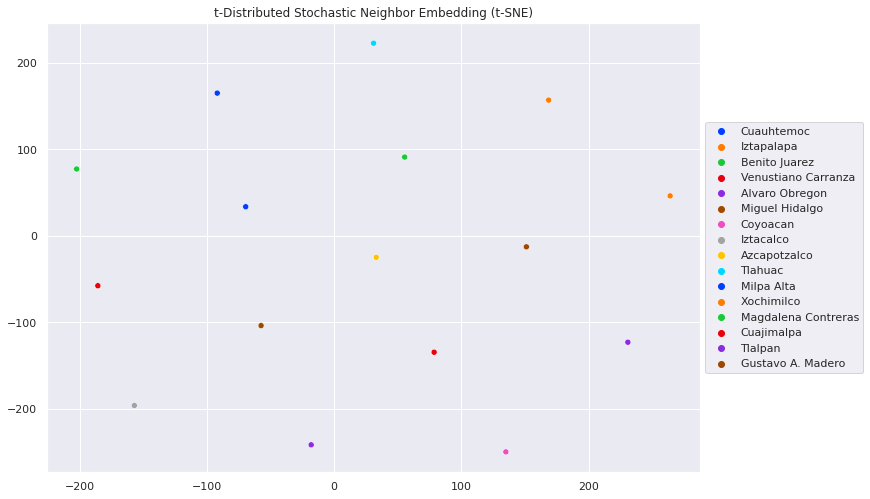

In [ ]:
palette = sns.color_palette("bright",16)
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title('t-Distributed Stochastic Neighbor Embedding (t-SNE)')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))


El t-SNE nos da resultados muy diferentes al PCA, aqui es necesario mover los hiperparametros ya que como vimos al cambiarlo puede dar resultados muy diferentes, aparte puede ser que influyó el tamaño del dataset que se usó.


### **Conclusiones**

Con respecto al problema, se encontró que hay una ligera correlación entre los postes del C5 y los tiraderos clandestinos, esto en conjunto con el mapa generado nos indica que existe el potencial de implementar los postes del C5 como medida preventiva de los tiraderos de basura clandestinos.

Además, al analizar el problema por alcaldías, se encontró que el problema de los tiraderos de basura clandestinos no está directamente relacionado al tamaño de población, ya que por ejemplo se encontró que la alcaldía Gutsavo A. Madero no presentó ningún tiradero y es la 2da Delegación con más población y Cuauhtémoc, que es la que más presentó tiraderos tiene poca población.

Las alcaldías que más reportan tiraderos son también de las que más postes del C5 tienen (Cuauhtémoc, Iztapalapa y Benito Juárez), por lo que se sugiere empezar la implementación con esas alcaldías con el fin de ver el impacto que tiene en el número de tiraderos clandestinos.

Los datos indican que hay una ligera correlación negativa entre los tiraderos clandestinos y la superficie de alcaldía (entre menor sea la superficie hay más tiraderos clandestinos y viceversa), sin embargo esto puede deberse a que, como vemos en el mapa, los tiraderos clandestinos por lo general se aglomeran en el centro de la CDMX, y las alcaldías con más superficie están en las afueras de la CDMX.

No está clara la relación entre áreas verdes y  el número de tiraderos clandestinos.
Se sugiere generar un registro actualizado de tiraderos clandestinos para poder tener en claro la posible relación, ya que la base de datos de tiraderos clandestinos es del 2017 y la de áreas verdes es del 2021.

Con respecto a la parte técnica, se lograron limpiar y unir diferentes bases de datos de las cuales se obtuvieron *insights* acerca de cómo están distribuidos los postes del C5, las áreas verdes, los tiraderos de basura clandestinos y la posible relación que hay entre estos. Además, gracias a la generación del nuevo dataset se logró visualizar de manera sencilla todo en un mismo mapa.

Una de las mejoras que se proponen a futuro es hacer el mapa del dataset generado de forma interactiva, el cual permita al usuario hacer el drill down y así poder analizar más a fondo si una de las soluciones a los tiraderos de basura clandestinos está en las áreas verdes/postes del C5.





